### Рынок заведений общественного питания Москвы

Инвесторы решили открыть заведение общественного питания в Москве.  

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.  

Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.


**Цель исследования:**
- Проанализировать заведения Москвы по категориям, географии, ценам, рейтингам и т.д.
- Определить возможность открытия кофейни и дать рекомендацию.

**План исследования:**
- [Общая информация о данных](#part_1)
- [Предобработка данных](#part_2)
- [Анализ данных](#part_3)
- [Исследование: открытие кофейни](#part_4)
- [Общий вывод](#part_6)

### Загрузка данных и общая информация <a id='part_1'></a>

In [21]:
#импорт библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
import json

In [22]:
#загрузка данных
try:
    data = pd.read_csv('....')
except:
    data = pd.read_csv('....')

In [23]:
#общая информация
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Стркутура `moscow_places.csv`:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000-1500 ₽»;
    - «Цена чашки капучино: 130-220 ₽»;
    - «Цена бокала пива: 400-600 ₽».
    - и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

In [24]:
#первые пять строк
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [25]:
def summary(df):
    print(df.info())
    summ = pd.DataFrame(df.dtypes, columns=['Data Type'])
    summ['Missing#'] = df.isna().sum()
    summ['Missing%'] = round((df.isna().sum())/len(df), 2)
    summ['Dups'] = df.duplicated().sum()
    summ['Uniques'] = df.nunique().values
    summ['Count'] = df.count().values
    desc = pd.DataFrame(df.describe(include='all').transpose())
    summ['Min'] = desc['min'].values
    summ['Max'] = desc['max'].values

    display(summ)

In [26]:
#общая информация
summary(data)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None


,Data Type,Missing#,Missing%,Dups,Uniques,Count,Min,Max
name,object,0,0.00,0,5614,8406,NaN,NaN
category,object,0,0.00,0,8,8406,NaN,NaN
address,object,0,0.00,0,5753,8406,NaN,NaN
district,object,0,0.00,0,9,8406,NaN,NaN
hours,object,536,0.06,0,1307,7870,NaN,NaN
lat,float64,0,0.00,0,8209,8406,55.573942,55.928943
lng,float64,0,0.00,0,8258,8406,37.355651,37.874466
rating,float64,0,0.00,0,41,8406,1.0,5.0
price,object,5091,0.61,0,4,3315,NaN,NaN
avg_bill,object,4590,0.55,0,897,3816,NaN,NaN


В датасете представлено 8406 заведений (5614 уникальных названий), в 8 категориях, в 9 округах, с 4 уровнями цен.

Полная информация по всем точкам есть по следующим столбцам: название, категория, адрес, округ, координаты, рейтинг и принадлежность к сети.

В столбце с часами работы есть пропуски, в столбцах с ценами и количеством мест пропусков очень много.

Максимальные значения среднего счета и количества мест кажутся неправдоподобными.

Столбцы со текстом имеют тип `object`, с числами - тип `float` и `int`.  



**Итог общего обзора:**
- названия столбцов в одном стиле
- дубликатов нет
- пропусков в столбцах с ценами и количеством мест очень много
- тип данных столбцов соответствует данным 

### Предобработка данных <a id='part_2'></a>

In [27]:
#проверка на полные дубликаты
print('Число полных дупликатов:', data.duplicated().sum())

Число полных дупликатов: 0


In [28]:
#посмотрим неявные дубликаты по названию и адресу
df_temp = data.copy()
df_temp['name'] = df_temp['name'].str.lower()
df_temp['address'] = df_temp['address'].str.lower()
df_temp.duplicated(['name', 'address']).sum()

4

In [29]:
#строки дубль
duplicate_rows_temp = df_temp[df_temp.duplicated(['name', 'address'], keep=False)]
duplicate_rows_temp

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Дубли отличаются временем работы и категорией, дублей мало, какая инофрмация корректнее, непонятно, оставим первое вхождение.

In [30]:
#индексы дублей
ind_dubl = duplicate_rows_temp.index[1::2]
ind_dubl

Index([215, 1511, 2420, 3109], dtype='int64')

In [31]:
#удяляем неявные дубликаты
data = data.drop(index=ind_dubl)

In [32]:
#проверим неявные дубликаты по названию и адресу
df_temp = data.copy()
df_temp['name'] = df_temp['name'].str.lower()
df_temp['address'] = df_temp['address'].str.lower()
df_temp.duplicated(['name', 'address']).sum()

0

Дубликатов больше нет.

In [33]:
#проверка на пропуски
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

In [34]:
#процент пропусков
round((data.isna().sum())/len(data), 2)

name                 0.00
category             0.00
address              0.00
district             0.00
hours                0.06
lat                  0.00
lng                  0.00
rating               0.00
price                0.61
avg_bill             0.55
middle_avg_bill      0.63
middle_coffee_cup    0.94
chain                0.00
seats                0.43
dtype: float64

Пропусков очень много, они касаются часов работы, цен и количества посадочных мест.  
Заполнить мы их не можем, удалять больше половины данных нецелесообразно.  
Все данные оставляем.


Создадим столбец `street` с названиями улиц из столбца с адресом.

In [35]:
#адреса
data['address'].sample(20)

1885    Москва, Большая Новодмитровская улица, 36с6
7308                  Москва, Люблинская улица, 153
4999                 Москва, Кожевническая улица, 7
5178                    Москва, Пятницкая улица, 45
3039                 Москва, Партизанская улица, 23
6909          Москва, Севастопольский проспект, 56А
3159                      Москва, улица Барклая, 10
7643              Москва, улица Академика Янгеля, 2
8154                  Москва, улица Мельникова, 16А
1682                  Москва, Дмитровское шоссе, 13
680          Москва, Дмитровское шоссе, 46, корп. 1
3799             Москва, улица Литвина-Седого, 10с2
2493                 Москва, Аргуновская улица, 2к1
7453             Москва, Новочеркасский бульвар, 13
5723          Москва, Ломоносовский проспект, 32/10
5738        Москва, Мичуринский проспект, 8, стр. 1
8161            Москва, Люсиновская улица, 48-50к10
8250                   Москва, Варшавское шоссе, 26
7398                Москва, Братиславская улица, 30
582         

In [36]:
#разобъем строку и выделим улицу
def streets(address):
    if 'округ' in address[1] or 'МКАД' in address[1]:
        if 'район' in address[2]:
            if len(address) == 3:
                return address[2]
            else:
                return address[3]
        else:
            return address[2]
    else:
        return address[1]
    
data['street'] = data['address'].str.split(pat=', ').apply(streets)

In [37]:
data['street']

0                 улица Дыбенко
1                 улица Дыбенко
2            Клязьминская улица
3       улица Маршала Федоренко
4           Правобережная улица
                 ...           
8401          Профсоюзная улица
8402      Пролетарский проспект
8403           Люблинская улица
8404           Люблинская улица
8405        Россошанский проезд
Name: street, Length: 8402, dtype: object

Создадим столбец `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение `True` — если заведение работает ежедневно и круглосуточно;
- логическое значение `False` — в противоположном случае.

In [38]:
#часы работы
data['hours']

0                                  ежедневно, 10:00–22:00
1                                  ежедневно, 10:00–22:00
2       пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...
3                                  ежедневно, 09:00–22:00
4                                  ежедневно, 10:00–22:00
                              ...                        
8401                               ежедневно, 09:00–02:00
8402                               ежедневно, 08:00–22:00
8403                             ежедневно, круглосуточно
8404                             ежедневно, круглосуточно
8405                             ежедневно, круглосуточно
Name: hours, Length: 8402, dtype: object

In [39]:
#выделим строки "ежедневно, круглосуточно"
def work_hours(hours):
    if not pd.isnull(hours):
        if hours == 'ежедневно, круглосуточно':
            return True
        else:
            return False
    else:
        return np.nan

data['is_24_7'] = data['hours'].apply(work_hours)

In [40]:
#количество значений
data['is_24_7'].value_counts()

is_24_7
False    7137
True      730
Name: count, dtype: int64

In [41]:
summary(data)

<class 'pandas.core.frame.DataFrame'>
Index: 8402 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
 14  street             8402 non-null   object 
 15  is_24_7            7867 non-null   object 
dtypes: float64(6), int64(1), obje

,Data Type,Missing#,Missing%,Dups,Uniques,Count,Min,Max
name,object,0,0.00,0,5613,8402,NaN,NaN
category,object,0,0.00,0,8,8402,NaN,NaN
address,object,0,0.00,0,5753,8402,NaN,NaN
district,object,0,0.00,0,9,8402,NaN,NaN
hours,object,535,0.06,0,1306,7867,NaN,NaN
lat,float64,0,0.00,0,8206,8402,55.573942,55.928943
lng,float64,0,0.00,0,8255,8402,37.355651,37.874466
rating,float64,0,0.00,0,41,8402,1.0,5.0
price,object,5087,0.61,0,4,3315,NaN,NaN
avg_bill,object,4586,0.55,0,897,3816,NaN,NaN


**Итог предобработки данных:**
- созданы столбцы с названиями улиц и с обозначением, что заведение работает ежедневно и круглосуточно
- пропусков очень много, данные оставлены
- явных дубликатов нет, частичные дубликаты удалены

### Анализ данных <a id='part_3'></a>

**Посмотрим категории заведений**

In [42]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

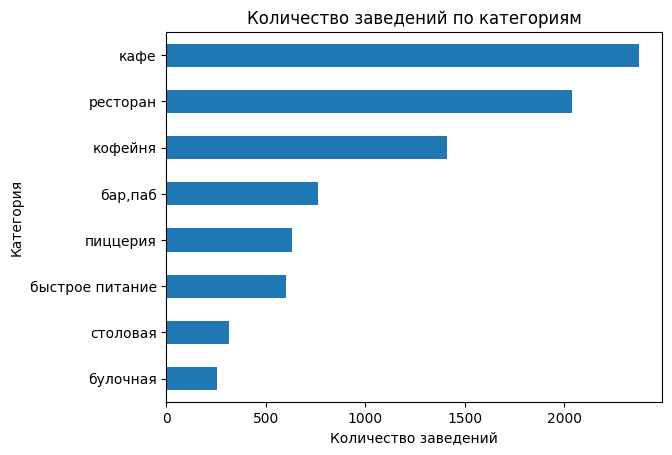

In [43]:
#число заведений по типам
venue_cat = data['category'].value_counts()
venue_cat.sort_values(ascending=True).plot.barh();
plt.title('Количество заведений по категориям');
plt.ylabel('Категория');
plt.xlabel('Количество заведений');

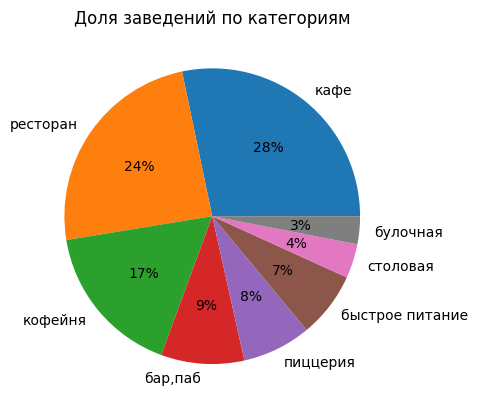

In [44]:
#доли категорий заведений
plt.pie(venue_cat, labels=venue_cat.index, autopct='%.0f%%')
plt.title('Доля заведений по категориям');

Больше всего кафе, ресторанов и кофеен, дальше близкие доли имеют бары, пиццерии и быстрое питание.  
Меньше всего в Москве столовых и булочных.

**Посмотрим количество посадочных мест в местах по категориям**

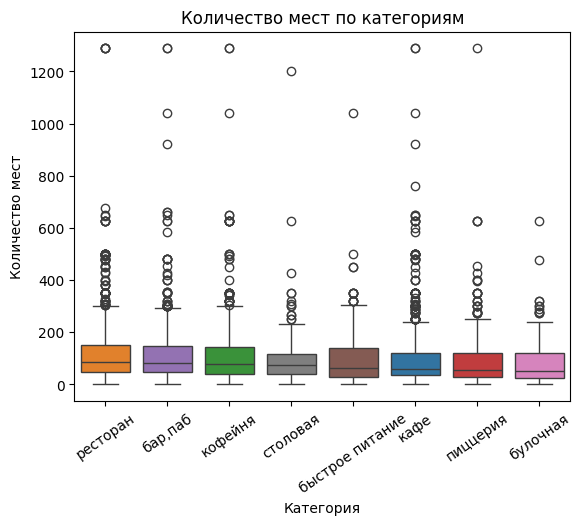

In [45]:
#количество мест по категориям, сортировка по медиане
my_order = data.groupby('category')['seats'].median().sort_values(ascending=False).index
sns.boxplot(x='category', y='seats', hue='category', data=data, order=my_order, dodge=False);
plt.xticks(rotation=35)
plt.title('Количество мест по категориям');
plt.xlabel('Категория');
plt.ylabel('Количество мест');
plt.legend([],[], frameon=False);

На графике видны выбросы с нереалистичными показателями.  
Посмотрим, как выбросы влияют на медианные показатели

In [46]:
#медианные показатели
median_seats = data.groupby('category', observed=False)['seats'].median().sort_values(ascending=False)
median_seats

category
ресторан           86.0
бар,паб            82.0
кофейня            80.0
столовая           75.5
быстрое питание    65.0
кафе               60.0
пиццерия           55.0
булочная           50.0
Name: seats, dtype: float64

In [47]:
#медианные показатели без выбросов
data[data['seats'] < 500].groupby('category', observed=False)['seats'].median().sort_values(ascending=False)

category
ресторан           85.0
бар,паб            80.0
кофейня            75.5
столовая           75.0
быстрое питание    65.0
кафе               60.0
пиццерия           52.0
булочная           50.0
Name: seats, dtype: float64

Выбросы либо не влияют, либо повышают медианные показатели на 2-3 места.

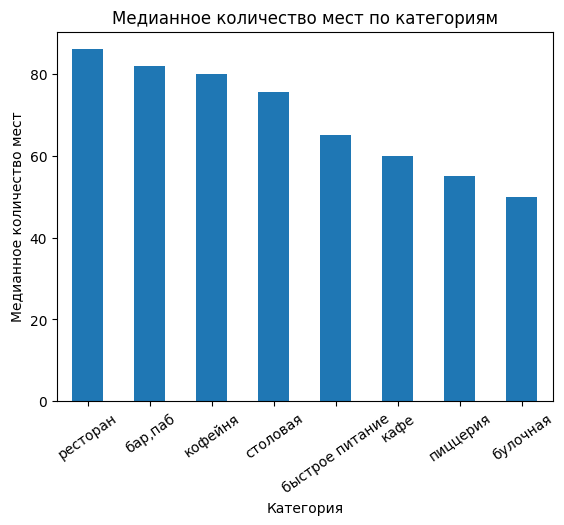

In [48]:
#медианное количество мест по категориям
median_seats.plot.bar();
plt.xticks(rotation=35);
plt.title('Медианное количество мест по категориям');
plt.ylabel('Медианное количество мест');
plt.xlabel('Категория');

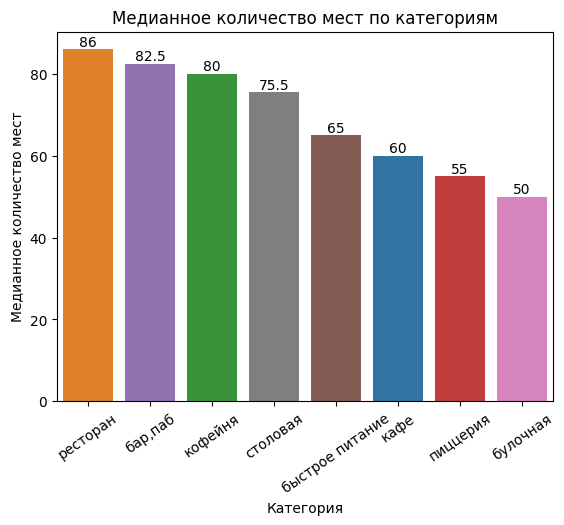

In [ ]:
#медианное количество мест по категориям
ax = sns.barplot(x='category', y='seats', hue='category', data=data, order=my_order, estimator='median', errorbar=None);
for container in ax.containers:
    ax.bar_label(container);
plt.xticks(rotation=35);
plt.title('Медианное количество мест по категориям');
plt.ylabel('Медианное количество мест');
plt.xlabel('Категория');

Больше всего количество посадочных мест в ресторанах, барах, кофейнях и столовых.  
Меньше всего - в булочных, пиццериях и кафе.  
Быстрое питание посередине.

**Соотношение сетевых и несетевых заведений**

In [49]:
#сетевые и несетевые заведения
data['chain'].value_counts()

chain
0    5199
1    3203
Name: count, dtype: int64

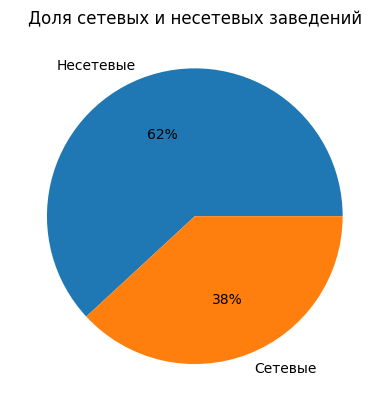

In [50]:
#доли сетевых и несетевых заведений
plt.pie(data['chain'].value_counts(), labels=['Несетевые', 'Сетевые'], autopct='%.0f%%')
plt.title('Доля сетевых и несетевых заведений');


Сетевых заведений в датасете 38%.  
Несетевых заведений в 1,5 раза больше.

**Категории сетевых заведений**

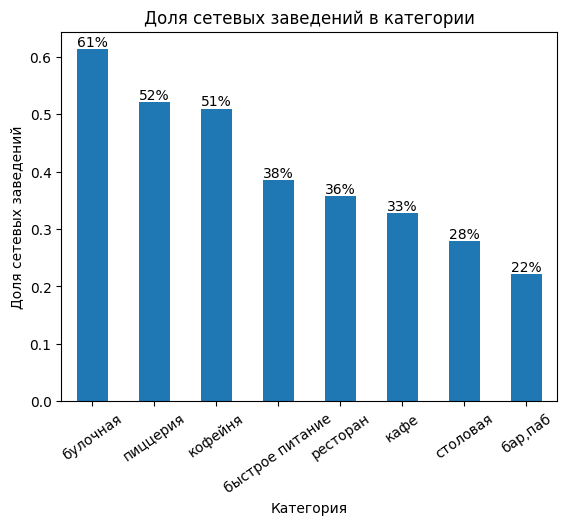

In [ ]:
#доля сетевых заведений в категории
venue_chain_share = data[data['chain'] == 1].groupby(by='category')['name'].count() / data.groupby(by='category')['name'].count()
ax = venue_chain_share.sort_values(ascending=False).plot.bar();
for container in ax.containers:
    ax.bar_label(container, fmt=lambda x: f'{x*100:.0f}%');
plt.xticks(rotation=35);
plt.title('Доля сетевых заведений в категории');
plt.ylabel('Доля сетевых заведений');
plt.xlabel('Категория');

Больше всего сетевых заведений среди булочных (61%), пиццерий (52%) и кофеен (51%).  
Меньше всего сетевых баров (22%) и столовых (28%).  
Кафе (33%), ресторанов (36%) и быстрого питания (38%) около трети.

**Топ-15 популярных сетей в Москве**

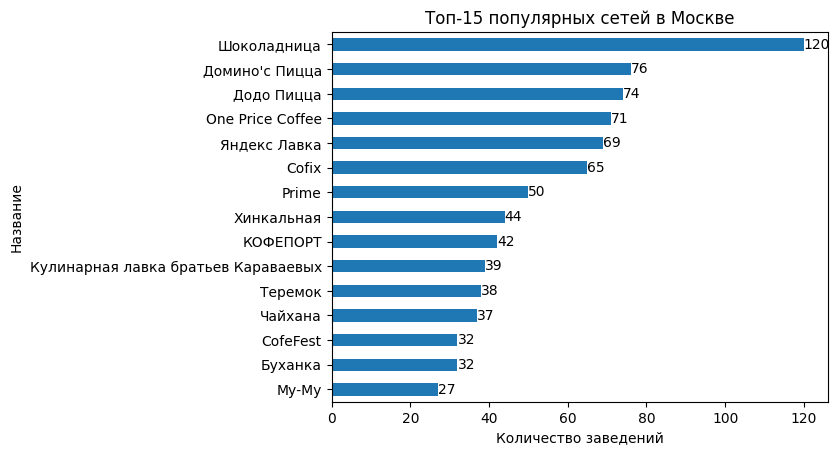

In [ ]:
#топ-15 сетей в Москве по количеству точек
top_15_chains = data[data['chain'] == 1]['name'].value_counts().head(15)
ax = top_15_chains.sort_values(ascending=True).plot.barh();
for container in ax.containers:
    ax.bar_label(container);
plt.title('Топ-15 популярных сетей в Москве');
plt.ylabel('Название');
plt.xlabel('Количество заведений');

Возглавляет топ `Шоколадница`, затем идут `Домино'с Пицца` и `Дод Пицца`.  
`Яндекс Лавка` на 5 месте.

In [53]:
#сетевые заведения с категорией
chain_venues = data[data['name'].isin(top_15_chains.index)][['name', 'category']].reset_index()
chain_venues

,index,name,category
0,13,Буханка,булочная
1,23,Буханка,булочная
2,32,Додо Пицца,пиццерия
3,34,Домино'с Пицца,пиццерия
4,46,CofeFest,кофейня
...,...,...,...
811,7973,Теремок,ресторан
812,7974,Хинкальная,ресторан
813,7979,Яндекс Лавка,ресторан
814,7980,Яндекс Лавка,ресторан


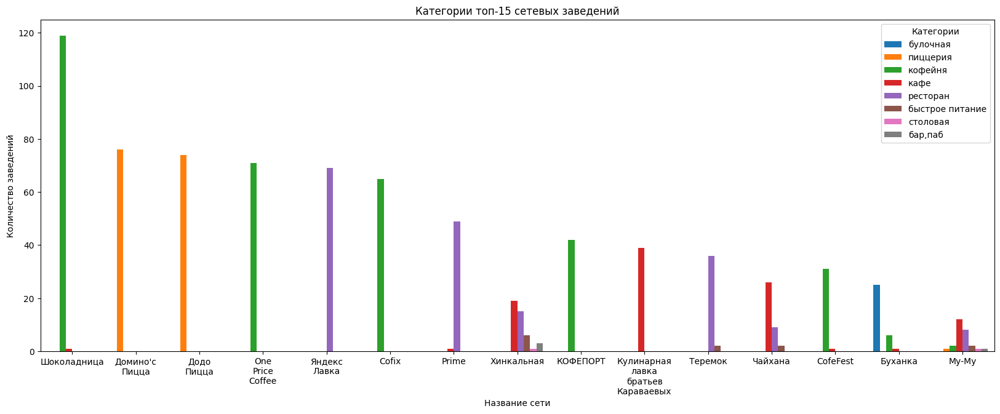

In [54]:
#категории топ-15 сетевых заведений
plt.figure(figsize=(20,7));
sns.countplot(x='name', hue='category', data=chain_venues, order=top_15_chains.index, saturation=1);
locs, labels = plt.xticks();
labels = [x.get_text().replace(' ', '\n') for x in labels]
plt.xticks(locs, labels, rotation=0);
plt.title('Категории топ-15 сетевых заведений');
plt.ylabel('Количество заведений');
plt.xlabel('Название сети');
plt.legend(title='Категории');

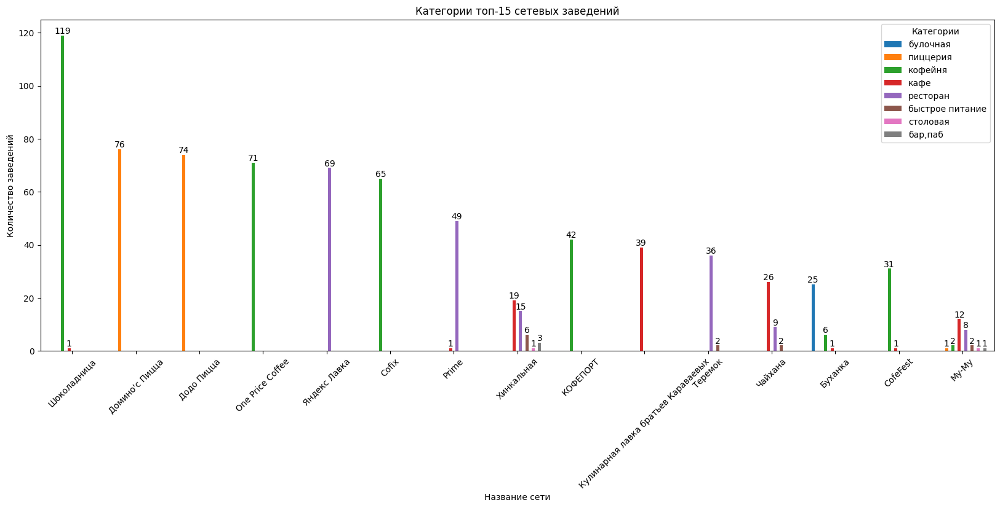

In [ ]:
#категории топ-15 сетевых заведений
plt.figure(figsize=(20,7));
ax = sns.countplot(x='name', hue='category', data=chain_venues, order=top_15_chains.index, saturation=1, gap=0.5);
for container in ax.containers:
    ax.bar_label(container);
plt.xticks(rotation=45);
plt.title('Категории топ-15 сетевых заведений');
plt.ylabel('Количество заведений');
plt.xlabel('Название сети');
plt.legend(title='Категории');

Заведения в топ-15 относятся к разных категориям, в одной сети могут быть разные категории.  
В начале списка преобладают кофейни, пиццерии и рестораны.  
Большинство сетей имеют одну главную категорию.  


**Количество заведений и количество заведений каждой категории по районам**

In [55]:
#заведения по округам
data['district'].value_counts()

district
Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: count, dtype: int64

In [56]:
#количество заведений по округам и категориям
district_venues = data.pivot_table(index='district', columns='category', values='name', aggfunc='count')
district_venues

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,238,150,71,218,24
Северный административный округ,68,39,58,234,193,77,188,41
Северо-Восточный административный округ,62,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


In [57]:
#столбец всего
district_venues['всего'] = district_venues.sum(axis=1)
district_venues

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,всего
district,,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40,798
Западный административный округ,50,37,62,238,150,71,218,24,850
Северный административный округ,68,39,58,234,193,77,188,41,898
Северо-Восточный административный округ,62,28,82,269,159,68,182,40,890
Северо-Западный административный округ,23,12,30,115,62,40,109,18,409
Центральный административный округ,364,50,87,464,428,113,670,66,2242
Юго-Восточный административный округ,38,13,67,282,89,55,145,25,714
Юго-Западный административный округ,38,27,61,238,96,64,168,17,709
Южный административный округ,68,25,85,264,131,73,202,44,892


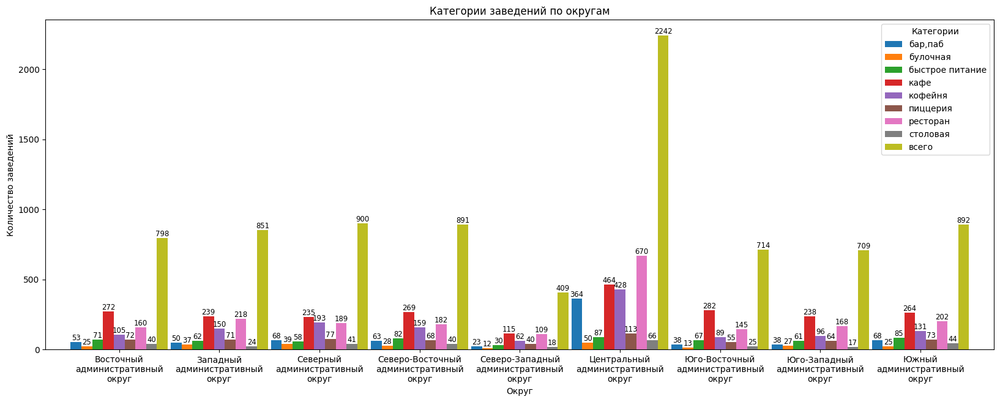

In [ ]:
#количество заведений по округам и категориям
ax= district_venues.plot.bar(figsize=(20,7), width=0.97)
for container in ax.containers:
    ax.bar_label(container, fontsize='small');
locs, labels = plt.xticks();
labels = [x.get_text().replace(' ', '\n') for x in labels]
plt.xticks(locs, labels, rotation=0);
plt.title('Категории заведений по округам');
plt.ylabel('Количество заведений');
plt.xlabel('Округ');
plt.legend(title='Категории');

Больше всего заведений в ЦАО,он сильно выделяется, меньше всего в СЗАО, в остальных 7 округах примерно одинаково.  
ЦАО выделяется гораздо большей долей ресторанов, баров и меньшей долей булочных и быстрого питания.

**Средние рейтинги по категориям заведений**

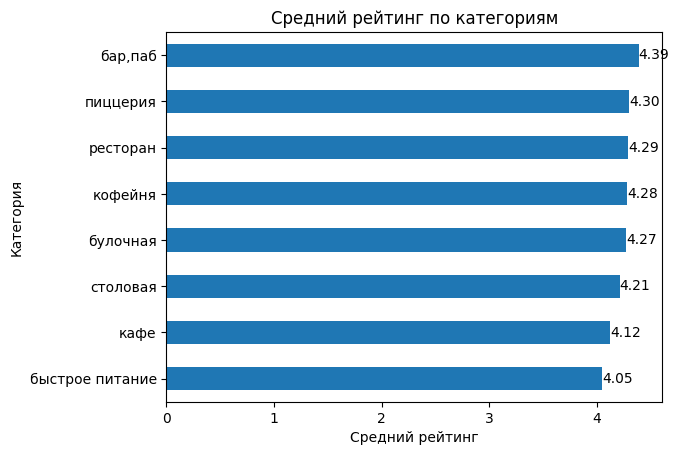

In [ ]:
#средний рейтинг по категориям
cat_mean_rating = data.groupby(by='category')['rating'].mean()
ax = cat_mean_rating.sort_values(ascending=True).plot.barh();
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f');
plt.title('Средний рейтинг по категориям');
plt.xlabel('Средний рейтинг');
plt.ylabel('Категория');

Самый высокий средний рейтинг у баров.  
Пиццерии, рестораны, кофейни и булочные имеют очень близкие рейтинги.  
Самый низкий рейтинг имеют быстрое питание и кафе.


**Хороплет со средним рейтингом заведений каждого района**

In [60]:
#средний рейтинг по округам
rating_dist = data.groupby('district', as_index=False)['rating'].agg('mean')
rating_dist

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
2,Северный административный округ,4.240980
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [61]:
#загружаем JSON-файл с границами округов Москвы
try:
    with open('/datasets/admin_level_geomap.geojson', 'r', encoding='utf8') as f:
        state_geo = json.load(f)
except:
    with open('admin_level_geomap.geojson', 'r', encoding='utf8') as f:
        state_geo = json.load(f)

#координаты Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

#создаём хороплет и добавляем его на карту
folium.Choropleth(
    geo_data=state_geo,
    data=rating_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    nan_fill_color='white',
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

#выводим карту
m

Максимальный средний рейтинг заведений в ЦАО, минимальный в ЮВАО.

**Все заведения на карте**

In [62]:
#создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

#создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

#пишем функцию, которая принимает строку датафрейма,
#создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

#применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

#выводим карту
m

На карте все 8406 заведений датасета.

**Топ-15 улиц по количеству заведений**

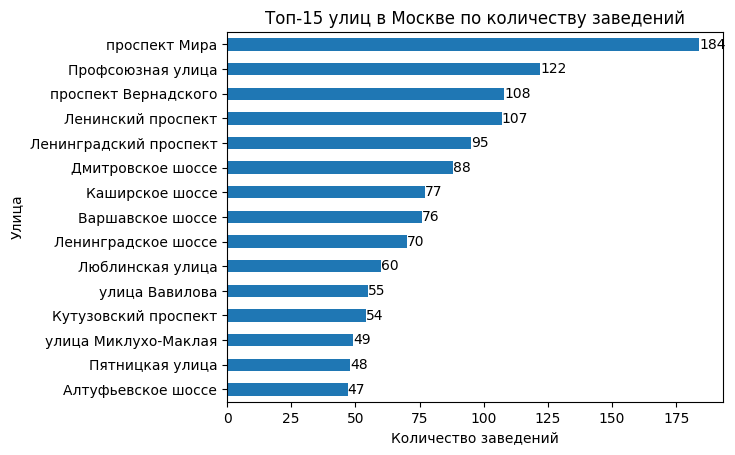

In [ ]:
#топ-15 улиц в Москве по количеству точек
top_15_streets = data['street'].value_counts().head(15)
ax = top_15_streets.sort_values(ascending=True).plot.barh();
for container in ax.containers:
    ax.bar_label(container);
plt.title('Топ-15 улиц в Москве по количеству заведений');
plt.ylabel('Улица');
plt.xlabel('Количество заведений');

В топе преобладают длинные улицы.  
С заметным отрывом лидирует проспект Мира, далее идут Профсоюзная улица, проспект Вернадского и Ленинский проспект.

In [64]:
#сетевые заведения с категорией
street_top = data[data['street'].isin(top_15_streets.index)][['street', 'category']].reset_index()
street_top

,index,street,category
0,8,Дмитровское шоссе,ресторан
1,17,Ленинградское шоссе,ресторан
2,26,Дмитровское шоссе,пиццерия
3,29,Дмитровское шоссе,столовая
4,43,Дмитровское шоссе,ресторан
...,...,...,...
1234,8356,Люблинская улица,кофейня
1235,8396,Ленинский проспект,ресторан
1236,8401,Профсоюзная улица,кафе
1237,8403,Люблинская улица,кафе


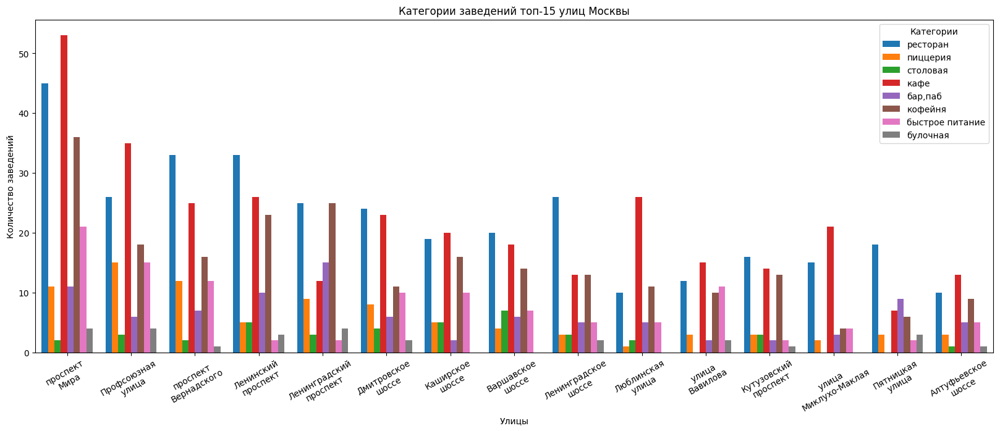

In [65]:
#топ-15 улиц с категориями заведений
plt.figure(figsize=(20,7));
sns.countplot(x='street', hue='category', data=street_top, order=top_15_streets.index, saturation=1);
locs, labels = plt.xticks();
labels = [x.get_text().replace(' ', '\n') for x in labels]
plt.xticks(locs, labels, rotation=30);
plt.title('Категории заведений топ-15 улиц Москвы');
plt.ylabel('Количество заведений');
plt.xlabel('Улицы');
plt.legend(title='Категории');

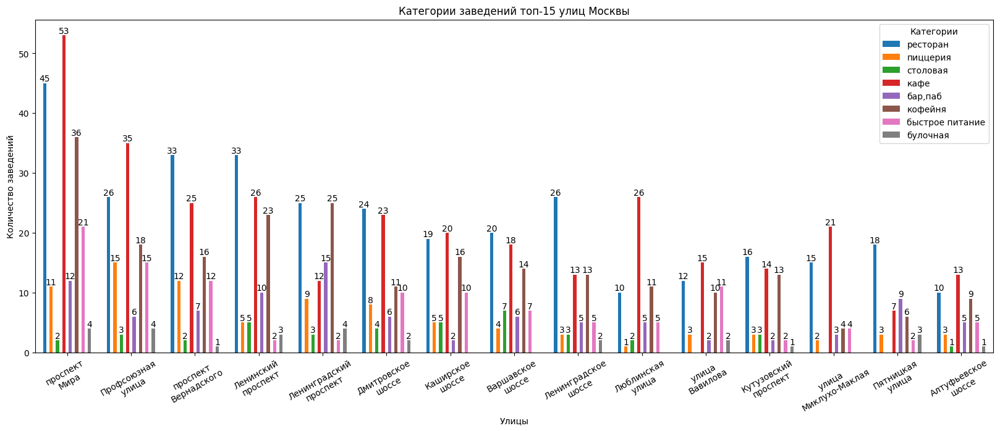

In [ ]:
#топ-15 улиц с категориями заведений
plt.figure(figsize=(20,7));
ax = sns.countplot(x='street', hue='category', data=street_top, order=top_15_streets.index, saturation=1, gap=0.5);
for container in ax.containers:
    ax.bar_label(container);
locs, labels = plt.xticks();
labels = [x.get_text().replace(' ', '\n') for x in labels]
plt.xticks(locs, labels, rotation=30);
plt.title('Категории заведений топ-15 улиц Москвы');
plt.ylabel('Количество заведений');
plt.xlabel('Улицы');
plt.legend(title='Категории');

Из замеченных тенденций: 
- на Ленинградском проспекте и Пятницкой улице рестораны заметно опережают кафе, там же много баров,
- на Люблинской улице много кафе,
- на Ленинградском проспекте много кофеен,
- на улице Вавилова много столовых,
- пиццерии распределены относительно равномерно порядку топа,
- на улице Миклухо-Маклая сильно преобладают кафе и рестораны


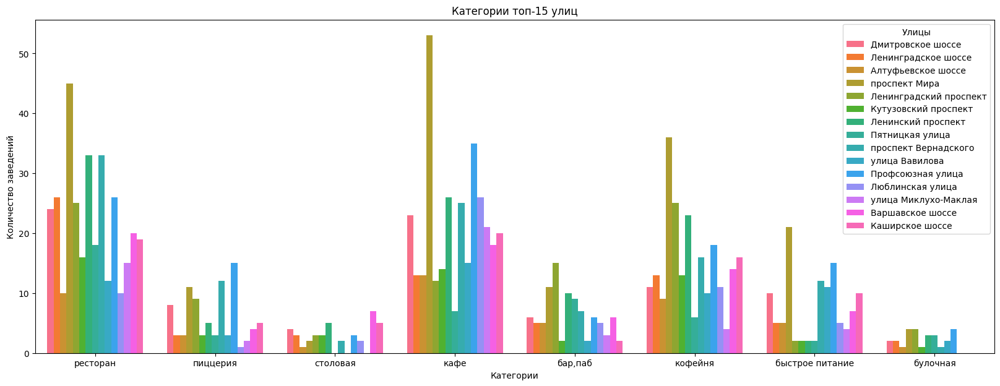

In [66]:
#топ-15 улиц с категориями заведений
plt.figure(figsize=(20,7));
sns.countplot(x='category', hue='street', data=street_top, saturation=1);
plt.xticks(rotation=0);
plt.title('Категории топ-15 улиц');
plt.ylabel('Количество заведений');
plt.xlabel('Категории');
plt.legend(title='Улицы');

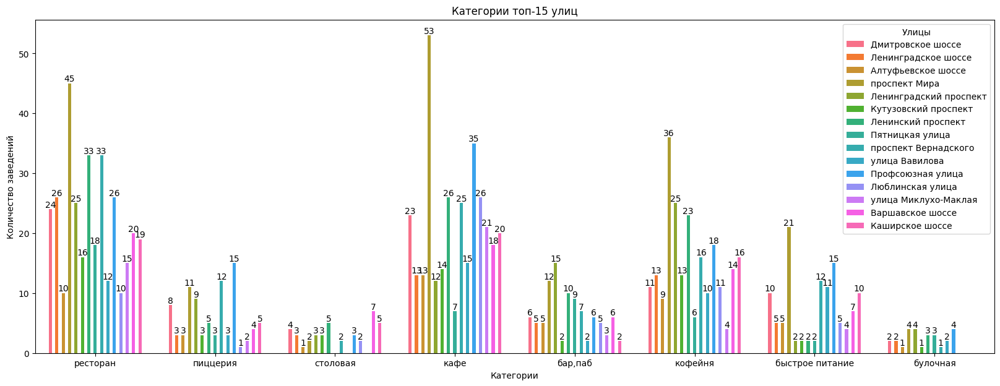

In [ ]:
#топ-15 улиц с категориями заведений
plt.figure(figsize=(20,7));
ax = sns.countplot(x='category', hue='street', data=street_top, saturation=1, gap=0.5);
for container in ax.containers:
    ax.bar_label(container);
plt.xticks(rotation=0);
plt.title('Категории топ-15 улиц');
plt.ylabel('Количество заведений');
plt.xlabel('Категории');
plt.legend(title='Улицы');

На топ-15 улиц больше всего ресторанов, кафе и кафеен.  
Бары, пиццерии и быстрое питание менее популярны.  
Булочных и столовых совсем мало.  
Наиболее неравномерно распределены по улицам бары, пиццерии и быстрое питание.

**Улицы с одним объектом общепита**

In [67]:
#найдем единичные упоминания улиц
streets = data['street'].value_counts()
streets_one = data[data['street'].map(streets) == 1]
streets_one

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,80-й километр,False
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,78-й километр,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8299,Шашлычный рай,кафе,"Москва, Юго-Восточный административный округ, ...",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.721304,37.733848,4.1,NaN,NaN,NaN,NaN,0,NaN,квартал 90А Грайвороново,False
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False
8395,Истира Запрафка,кафе,"Москва, Юго-Восточный административный округ, ...",Юго-Восточный административный округ,NaN,55.724686,37.710558,2.9,NaN,NaN,NaN,NaN,0,NaN,Нижегородский район,NaN


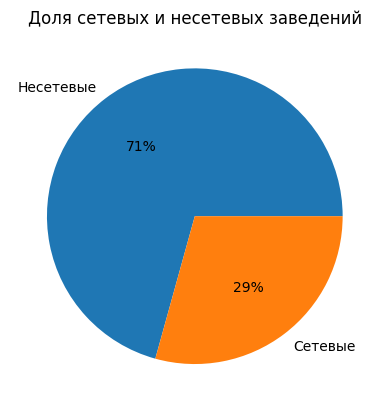

In [68]:
#доли сетевых и несетевых заведений
plt.pie(streets_one['chain'].value_counts(), labels=['Несетевые', 'Сетевые'], autopct='%.0f%%')
plt.title('Доля сетевых и несетевых заведений');

Доля несетевых заведений заметно больше на улицах с одним заведением.

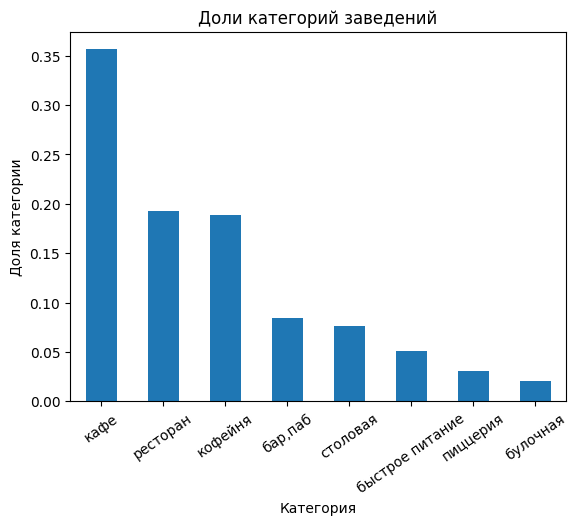

In [97]:
#доли категорий заведений
venue_cat_one_share = streets_one.groupby(by='category')['name'].count() / streets_one['name'].count()
venue_cat_one_share.sort_values(ascending=False).plot.bar();
plt.xticks(rotation=35);
plt.title('Доли категорий заведений');
plt.ylabel('Доля категории');
plt.xlabel('Категория');

На улицах с одним заведением больше кафе, меньше ресторанов и пиццерий.

**Средний чек и география**

In [70]:
#медианный средний чек по округам
avg_bill_geo = data.groupby('district', as_index=False)['middle_avg_bill'].median()
avg_bill_geo


,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [71]:
#создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

#создаём хороплет и добавляем его на карту
folium.Choropleth(
    geo_data=state_geo,
    data=avg_bill_geo,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    nan_fill_color='white',
    legend_name='Медианный средний чек по округам',
).add_to(m)

#выводим карту
m

Максимальный средний чек в ЦАО и ЗАО, минимальный в СВАО, ЮЗАО и ЮАО.  
На карте хорошо заметны дорогие и престижные центр и запад.  
На следущем уровне находятся северо-запад, север и юго-запад.  
Зымыкают список наименее престижные северо-восток, юго-восток и юг.


**Улицы с заведениями с максимальным рейтингом**

<Axes: >

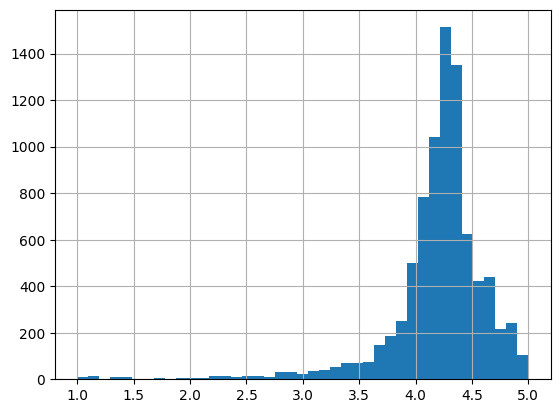

In [72]:
#рейтинг заведений
data['rating'].hist(bins=41)

Резкий спад количества происходит с 4,5.  
Возмем топ улиц с рейтингом 4,5+.

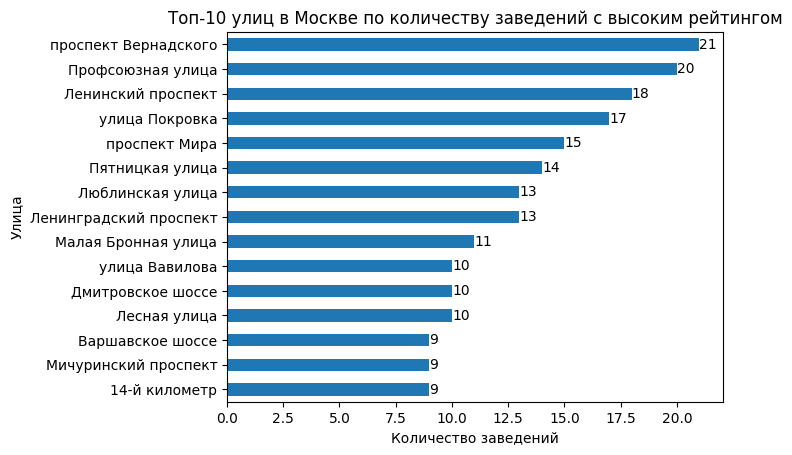

In [ ]:
#топ-15 улиц в Москве по количеству точек с высоким рейтингом
top_15_rating_streets = data[data['rating'] > 4.5]['street'].value_counts().head(15)
ax = top_15_rating_streets.sort_values(ascending=True).plot.barh();
for container in ax.containers:
    ax.bar_label(container);
plt.title('Топ-10 улиц в Москве по количеству заведений с высоким рейтингом');
plt.ylabel('Улица');
plt.xlabel('Количество заведений');

Больше всего заведений с высоким рейтингом на проспекте Вернадского, Профсоюзной улице, Ленинском проспекте и Покровке.

In [74]:
#медианный средний чек и медианный рейтинг на улицах с максимальным количеством точек с высоким рейтингом
top_rate_street = data[(data['street'].isin(top_15_rating_streets.index)) & (data['rating'] > 4.5)]
avg_bill_high_rating= top_rate_street.groupby('street')[['middle_avg_bill', 'rating', 'name']].agg({'middle_avg_bill': 'median', 'rating': 'median', 'name': 'count'})
avg_bill_high_rating


,middle_avg_bill,rating,name
street,,,
14-й километр,450.0,4.9,9
Варшавское шоссе,NaN,4.9,9
Дмитровское шоссе,575.0,4.9,10
Ленинградский проспект,1500.0,4.7,13
Ленинский проспект,1500.0,4.7,18
Лесная улица,1750.0,4.7,10
Люблинская улица,300.0,4.7,13
Малая Бронная улица,1500.0,4.7,11
Мичуринский проспект,1500.0,4.7,9


Среди улиц с большим количеством точек с высоким рейтингом самый высокий рейтинг имеют заведения на 14-м километре МКАД, Варшавском шоссе и Дмитровском шоссе.

Корреляция среднего чека и рейтинга заведения

In [75]:
data[['middle_avg_bill', 'rating']].corr()

,middle_avg_bill,rating
middle_avg_bill,1.000000,0.183238
rating,0.183238,1.000000


Корреляции среднего чека и рейтинга заведения нет.  
Высокий рейтинг могут иметь заведения с разным средним счетом.

**Итог анализа данных:**
- среди всех заведений больше всего кафе, ресторанов и кофеен
- больше всего посадочных мест в ресторанах, барах, кофейнях и столовых
- сетевых заведений 62%
- больше всего сетевых заведений среди булочных, пиццерий и кофеен
- топ-6 сетей по количеству заведений: `Шоколадница`, `Домино'с Пицца`, `Дод Пицца`, `One Price Coffee`, `Яндекс Лавка`, `Cofix`
- среди сетей преобладает одна категория, например, `Шоколадница`, `One Price Coffee`, `Cofix` - кофейни
- самые популяные категории в топ-15 сетей: кофейни, пиццерии и рестораны
- несмотря на то, что булочных больше всего среди сетей, в топ-15 попала только одна сеть булочных - `Буханка`
- больше всего заведений с большым отрывом в ЦАО, меньше всего в СЗАО, в остальных 7 округах заведения распределены примерно одинаково
- ЦАО выделяется гораздо большей долей ресторанов, баров и меньшей долей булочных и быстрого питания
- самый высокий средний рейтинг заведений у баров, самый низкий средний рейтинг имеют быстрое питание и кафе
- максимальный средний рейтинг заведений в ЦАО, минимальный в ЮВАО
- больше всего заведений на проспекте Мира, далее идут Профсоюзная улица, проспект Вернадского и Ленинский проспект
- некоторые наблюдения в топ-15 улиц:
    - на Ленинградском проспекте и Пятницкой улице рестораны заметно опережают кафе, там же много баров
    - на Люблинской улице много кафе
    - на Ленинградском проспекте много кофеен
    - на улице Вавилова много столовых
    - пиццерии распределены относительно равномерно порядку топа
    - на улице Миклухо-Маклая преобладают кафе и рестораны
    - больше всего ресторанов, кафе и кофеен
    - бары, пиццерии и быстрое питание менее популярны
    - булочных и столовых совсем мало
- доля несетевых заведений заметно больше на улицах с одним заведением
- на улицах с одним заведением больше кафе, но меньше ресторанов и пиццерий
- максимальный средний чек в ЦАО и ЗАО, минимальный в СВАО, ЮЗАО и ЮАО
- больше всего заведений с высоким рейтингом на проспекте Вернадского, Профсоюзной улице, Ленинском проспекте и Покровке
- cреди улиц с большим количеством точек с высоким рейтингом самый высокий рейтинг имеют заведения на 14-м километре МКАД, Варшавском шоссе и Дмитровском шоссе
- корреляции среднего чека и рейтинга заведения нет

 ### Исследование: открытие кофейни <a id='part_4'></a>

In [76]:
#количество кофеен в датасете
print('количество кофеен:', data[data['category'] == 'кофейня']['name'].count())


количество кофеен: 1413


In [77]:
#где расположены кофейни
district_coffeehouses = district_venues['кофейня'].reset_index()
district_coffeehouses['share,%'] = round(district_coffeehouses['кофейня'] / district_venues['кофейня'].sum(), 3) * 100
district_coffeehouses

,district,кофейня,"share,%"
0,Восточный административный округ,105,7.4
1,Западный административный округ,150,10.6
2,Северный административный округ,193,13.7
3,Северо-Восточный административный округ,159,11.3
4,Северо-Западный административный округ,62,4.4
5,Центральный административный округ,428,30.3
6,Юго-Восточный административный округ,89,6.3
7,Юго-Западный административный округ,96,6.8
8,Южный административный округ,131,9.3


Посмотрим расположение кофеен по округам

In [78]:
#создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

#создаём хороплет и добавляем его на карту
folium.Choropleth(
    geo_data=state_geo,
    data=district_coffeehouses,
    columns=['district', 'кофейня'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    nan_fill_color='white',
    legend_name='Количество кофеен по округам',
).add_to(m)

#выводим карту
m

30% кофеен расположено в ЦАО, все нецентральные округа сильно отстают.

Время работы кофеен.

In [79]:
data[data['category'] == 'кофейня']['hours'].value_counts().head(10)

hours
ежедневно, 10:00–22:00                  140
ежедневно, 08:00–22:00                   60
ежедневно, круглосуточно                 59
ежедневно, 09:00–22:00                   57
пн-пт 08:00–19:00                        46
пн-пт 08:00–21:00; сб,вс 09:00–21:00     46
ежедневно, 09:00–21:00                   43
пн-пт 08:00–22:00; сб,вс 09:00–22:00     42
ежедневно, 08:00–21:00                   36
пн-пт 08:00–18:30                        34
Name: count, dtype: int64

Самое популярное время работы кофеен - `ежедневно, 10:00-22:00`.  


In [80]:
#кругосуточные кофейни
ch_24_7 = data[(data['category'] == 'кофейня') & (data['is_24_7'])][['name', 'chain', 'district', 'lat', 'lng', 'rating']].sort_values('name')
ch_24_7

,name,chain,district,lat,lng,rating
2030,Cinnabon,1,Центральный административный округ,55.778271,37.601991,4.2
4653,Cofix,1,Центральный административный округ,55.770414,37.651068,4.3
2516,Cofix,1,Центральный административный округ,55.776955,37.655391,3.8
5891,FoodMoscowCoffee,0,Юго-Западный административный округ,55.703333,37.573414,4.1
4112,One And Double,0,Западный административный округ,55.743048,37.564394,4.1
2334,One Price Coffee,1,Центральный административный округ,55.776860,37.654701,4.1
6890,"One more, please",0,Юго-Западный административный округ,55.667990,37.563342,4.3
5256,One&Double,1,Центральный административный округ,55.729675,37.639367,4.1
6592,The wild bean cafe,1,Западный административный округ,55.660802,37.480297,4.2
200,Wild Bean,1,Северный административный округ,55.878477,37.543426,3.5


Круглосуточные кофейни в основном сетевые и расположены в ЦАО, ЮЗАО и САО.

Посмотрим, где они расположены

In [81]:
# создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    folium.Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера к первым 5 записям датафрейма
ch_24_7.apply(create_marker, axis=1)
    
# выводим карту
m

Могло быть предположение, что круглосуточные кофейни расположены возле вокзалов, там они тоже есть, но закономерности расположения на подобной карте понять трудно.  
Большинство тяготеет к центру.

Рейтинги кофеен.

In [82]:
#средний рейтинг кофеен
data['rating'].mean().round(2)

4.23

In [83]:
#рейтинг кофеен по округам
rating_ch = data[data['category'] == 'кофейня'].groupby('district', as_index=False)['rating'].agg('mean')
rating_ch

,district,rating
0,Восточный административный округ,4.282857
1,Западный административный округ,4.195333
2,Северный административный округ,4.291710
3,Северо-Восточный административный округ,4.216981
4,Северо-Западный административный округ,4.325806
5,Центральный административный округ,4.336449
6,Юго-Восточный административный округ,4.225843
7,Юго-Западный административный округ,4.283333
8,Южный административный округ,4.232824


In [84]:
#создаём карту Москвы
m = folium.Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

#создаём хороплет и добавляем его на карту
folium.Choropleth(
    geo_data=state_geo,
    data=rating_ch,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='GnBu',
    fill_opacity=0.8,
    nan_fill_color='white',
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

#выводим карту
m

Средний рейтинг по округам отличается не очень сильно, лучше всего оцениваются кофейни в ЦАО и СЗАО.  
В целом кофейни имеют не самые высокие рейтинги.

Стоимость чашки кофе в кофейнях.

In [85]:
#медианная стоимость чашки кофе в кофейнях
data[data['category'] == 'кофейня']['middle_coffee_cup'].median().round(2)

170.0

In [86]:
#медианная стоимость чашки кофе в кофейнях по округам
data[data['category'] == 'кофейня'].groupby('district', as_index=False)['middle_coffee_cup'].agg('median')


,district,middle_coffee_cup
0,Восточный административный округ,135.0
1,Западный административный округ,189.0
2,Северный административный округ,159.0
3,Северо-Восточный административный округ,162.5
4,Северо-Западный административный округ,165.0
5,Центральный административный округ,190.0
6,Юго-Восточный административный округ,147.5
7,Юго-Западный административный округ,198.0
8,Южный административный округ,150.0


In [87]:
#медианное количество мест в несетевых кофейнях по округам
data[(data['category'] == 'кофейня') & (data['chain'] == 0)].groupby('district', as_index=False)['seats'].agg('median')

,district,seats
0,Восточный административный округ,52.0
1,Западный административный округ,98.0
2,Северный административный округ,70.0
3,Северо-Восточный административный округ,52.0
4,Северо-Западный административный округ,25.5
5,Центральный административный округ,50.0
6,Юго-Восточный административный округ,54.0
7,Юго-Западный административный округ,50.0
8,Южный административный округ,80.0


Количество мест в кофейнях сильно отличается по округам.

In [88]:
#самая частая ценовая категория кофеен по округам
data[data['category'] == 'кофейня'].groupby('district', as_index=False)['price'].apply(lambda x: x.mode())

,district,price
0,Восточный административный округ,средние
1,Западный административный округ,средние
2,Северный административный округ,средние
3,Северо-Восточный административный округ,средние
4,Северо-Западный административный округ,средние
5,Центральный административный округ,средние
6,Юго-Восточный административный округ,средние
7,Юго-Западный административный округ,средние
8,Южный административный округ,средние


Самая частая ценовая категория кофеен - средняя.

In [89]:
#время работы кофеен в ЦАО
data[(data['category'] == 'кофейня') & (data['district'] == 'Центральный административный округ')]['hours'].value_counts().head(10)

hours
ежедневно, круглосуточно                26
ежедневно, 10:00–22:00                  16
пн-пт 08:00–22:00; сб,вс 10:00–22:00    15
пн-пт 08:00–22:00; сб,вс 09:00–22:00    15
ежедневно, 08:00–22:00                  14
ежедневно, 09:00–21:00                  12
пн-пт 08:00–21:00; сб,вс 09:00–21:00    11
пн-пт 08:00–18:30                       10
пн-пт 08:00–23:00; сб,вс 09:00–23:00    10
ежедневно, 07:00–22:00                   8
Name: count, dtype: int64

Самое популярное время работы - кругосуточно.

In [90]:
#время работы несетевых кофеен в ЦАО
data[(data['category'] == 'кофейня') & (data['district'] == 'Центральный административный округ') & (data['chain'] == 0)]['hours'].value_counts().head(10)

hours
ежедневно, 10:00–22:00                  9
ежедневно, 09:00–21:00                  8
пн-пт 08:00–21:00; сб,вс 09:00–21:00    8
пн-пт 08:00–22:00; сб,вс 10:00–22:00    7
ежедневно, 08:00–21:00                  7
ежедневно, круглосуточно                6
ежедневно, 09:00–20:00                  6
ежедневно, 09:00–22:00                  6
ежедневно, 08:00–22:00                  5
пн-пт 08:00–22:00; сб,вс 09:00–22:00    5
Name: count, dtype: int64

**Рекомендации**

Наибольший спрос на кофейни в ЦАО, но там же и наибольшая конкуренция.  
Если не бояться конкуренции, то можно открыть кофейню в ЦАО, со средней ценовой категорией, с ценой чашки кофе не более 190 руб., с максимальным временем работы, можно круглосуточно, с количеством мест около 50.

### Общий вывод <a id='part_6'></a>

**Цель исследования:**
- Проанализировать заведения Москвы по категориям, географии, ценам, рейтингам и т.д.
- Определить возможность открытия кофейни и дать рекомендацию.
- Подготовить презентацию.

**Исходные данные**: датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

**Предобработка данных:** проанализированы пропуски и дубликаты, созданы столбцы с названиями улиц и с обозначением, что заведение работает ежедневно и круглосуточно.

**Анализ данных:**
- Среди всех заведений больше всего кафе, ресторанов и кофеен.
- Больше всего посадочных мест в ресторанах, барах, кофейнях и столовых.
- Сетевых заведений 62%, несетевых 38%.
- Больше всего сетевых заведений среди булочных, пиццерий и кофеен.
- Топ-6 сетей по количеству заведений: `Шоколадница`, `Домино'с Пицца`, `Додо Пицца`, `One Price Coffee`, `Яндекс Лавка`, `Cofix`.
- Для сетей характерна одна категория, например, `Шоколадница`, `One Price Coffee`, `Cofix` - кофейни.
- Самые популяные категории в топ-15 сетей: кофейни, пиццерии и рестораны.
- Несмотря на то, что булочных больше всего среди сетей, в топ-15 попала только одна сеть булочных - `Буханка`.
- Больше всего заведений с большим отрывом в ЦАО, меньше всего в СЗАО, в остальных 7 округах заведения распределены примерно одинаково.
- ЦАО выделяется гораздо большей долей ресторанов, баров и меньшей долей булочных и быстрого питания.
- Самый высокий средний рейтинг заведений у баров, самый низкий средний рейтинг имеют быстрое питание и кафе.
- Максимальный средний рейтинг заведений в ЦАО, минимальный в ЮВАО.
- Больше всего заведений на проспекте Мира, далее идут Профсоюзная улица, проспект Вернадского и Ленинский проспект.
- Некоторые наблюдения на топ-15 улиц по количеству заведений:
    - На Ленинградском проспекте и Пятницкой улице рестораны заметно опережают кафе, там же много баров.
    - На Люблинской улице много кафе.
    - На Ленинградском проспекте много кофеен.
    - На улице Вавилова много столовых.
    - Пиццерии распределены относительно равномерно.
    - На улице Миклухо-Маклая преобладают кафе и рестораны.
    - Больше всего ресторанов, кафе и кофеен.
    - Бары, пиццерии и быстрое питание менее популярны.
    - Булочных и столовых совсем мало.
- На улицах с одним заведением доля несетевых заведений заметно больше (71%).
- На улицах с одним заведением больше кафе, но меньше ресторанов и пиццерий.
- Максимальный средний чек в ЦАО и ЗАО, минимальный в СВАО, ЮЗАО и ЮАО.
- Больше всего заведений с высоким рейтингом на проспекте Вернадского, Профсоюзной улице, Ленинском проспекте и Покровке.
- Среди улиц с большим количеством точек с высоким рейтингом самый высокий рейтинг имеют заведения на 14-м километре МКАД, Варшавском шоссе и Дмитровском шоссе.
- Корреляции среднего чека и рейтинга заведения нет.

**Исследование: открытие кофейни:**
- В датасете 1413 кофеен.
- 30% кофеен расположено в ЦАО, все нецентральные округа сильно отстают.
- Самое популярное время работы кофеен - `ежедневно, 10:00-22:00`.
- Круглосуточные кофейни в основном сетевые и расположены в ЦАО, ЮЗАО и САО.
- Закономерности расположения круглосуточных кофеен не видно, кроме тяготения к центру.
- Средний рейтинг кофеен по городу 4,23.
- Средний рейтинг кофеен по округам отличается не очень сильно, лучше всего оцениваются кофейни в ЦАО (4,34) и СЗАО (4,33). В целом кофейни имеют не самые высокие рейтинги.
- Медианное количество мест в кофейнях сильно отличается по округам, от 98 в ЗАО до 25,5 в СЗАО.
- Самая частая ценовая категория кофеен - средняя.
- Медианная стоимость чашки кофе в кофейнях 170 руб. Максимум в ЦАО (190) и ЮЗАО (198), минимум в ВАО (135).
- Самое популярное время работы кофеен в ЦАО - кругосуточно. В основном это сетевые кофейни.

**Рекомендация по открытию кофейни**:
- Наибольший спрос на кофейни в ЦАО, но там же и наибольшая конкуренция.  
- Если не бояться конкуренции, то можно открыть кофейню в ЦАО, со средней ценовой категорией, с ценой чашки кофе не более 190 руб., с максимальным временем работы, можно круглосуточно, с количеством мест около 50.